In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from concurrent.futures import ProcessPoolExecutor

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2901108938.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
%matplotlib inline

In [3]:
# Function to perform Augmented Dickey-Fuller test
def adf_test(series, signif=0.05):
    dftest = adfuller(series, autolag='AIC')
    #print('dftest  ',dftest)
    #dftest[1] is p-value 
    p_value = dftest[1]
    return p_value <= signif  # Returns True if p-value is less than significance level

In [4]:
#Granger causality test to determine variable relevance
#https://towardsdatascience.com/a-quick-introduction-on-granger-causality-testing-for-time-series-analysis-7113dc9420d2
def granger_causality_matrix(df, feature, maxlag=1):
    result = pd.DataFrame(np.zeros((len(feature), len(feature))), columns=feature, index=feature)
    for c in result.columns:
        for r in result.index:
            test_result = grangercausalitytests(df[[r, c]], maxlag=maxlag)
            p_values = [round(test[0]['ssr_chi2test'][1], 4) for test in test_result.values()]
            min_p_value = np.min(p_values)
            result.loc[r, c] = min_p_value
    result.columns = [var + '_x' for var in feature]
    result.index = [var + '_y' for var in feature]
    return result

In [5]:
def check_timestamp_irreg(df_input):
    time_diff = df_input.index.to_series().diff()
    print(time_diff)
    max_diff = time_diff.max()
    min_diff = time_diff.min()
    mean_diff = time_diff.mean()
    median_diff = time_diff.median()
    
    # Print the results
    print(f"Max difference: {max_diff}")
    print(f"Min difference: {min_diff}")
    print(f"Mean difference: {mean_diff}")
    print(f"Median difference: {median_diff}")
    return time_diff

In [6]:
def resampling_interpolation(df_input):
    # Step 4: Resample the data to your desired frequency; L is millisecond
    df_resampled = df_input.resample('30L').mean()  # 'S' stands for second intervals
    
    # Step 5: Interpolate missing values if needed
    df_resampled = df_resampled.interpolate(method='linear')
    
    # Print the resampled DataFrame
    #print(df_resampled)
    return df_resampled

In [7]:
def data_normalization(df_input,mode,scaler):
    if mode=='fit':
        df_scaled = pd.DataFrame(scaler.fit_transform(df_input), columns=df_input.columns, index=df_input.index)
    elif mode=='transform':
        df_scaled = pd.DataFrame(scaler.transform(df_input), columns=df_input.columns, index=df_input.index)
    return df_scaled,scaler

In [8]:
def preprocess_df(df,feature):
    #print(df.head())
    
    df['timestamp'] = df['timestamp'] / 1e9  # Convert from nanoseconds to seconds
    #Convert to a pandas datetime object
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')
    #Set the 'timestamp' column as the index
    df.set_index('timestamp', inplace=True)
    # Plot the features for visualization
    df[feature].plot(subplots=True, figsize=(10, 12))
    plt.legend(loc='upper right')

    plt.show()

    df_diff = df.copy()

    for col in feature:
        print('feature  ',col)
        #print('cc *******      ',adf_test(df[col]))
        if not adf_test(df[col]):
            print(f"{col} is not stationary, differencing...")
            df_diff[col] = df[col].diff().dropna()
        else:
            print("======== stationary =======")
    # Drop the first rows with NaN values after differencing
    df_diff.dropna(inplace=True)

    time_diff = check_timestamp_irreg(df)
    time_diff = time_diff.dropna()
    print(time_diff)
    plt.figure(figsize=(10, 5))
    time_diff.plot(kind='bar')
    plt.ylabel('Time Difference')
    plt.title('Time Gaps Between Consecutive Timestamps')
    plt.show()
    
    data_resampl=resampling_interpolation(df)
    check_timestamp_irreg(data_resampl)
    return data_resampl

In [9]:
# Fit the VAR model using success data
def check_optimal_lag(df_train_norm,feature,maxlags = 50):
    
    # Initialize lists to store information criteria values
    aic_vals = []
    bic_vals = []
    fpe_vals = []
    hqic_vals = []
    
    # Fit VAR model for each lag and collect the information criteria
    for lag in range(1, maxlags + 1):
        model = VAR(df_train_norm[feature])
        result = model.fit(lag)
        
        # Append the AIC, BIC, FPE, and HQIC values for each lag
        aic_vals.append(result.aic)
        bic_vals.append(result.bic)
        fpe_vals.append(result.fpe)
        hqic_vals.append(result.hqic)
    
    # Create a list of lag values
    lags = list(range(1, maxlags + 1))
    
    # Plot the information criteria
    plt.figure(1,figsize=(10, 6))
    plt.plot(lags, aic_vals, label='AIC')
    plt.plot(lags, bic_vals, label='BIC')
    plt.plot(lags, hqic_vals, label='HQIC')
    
    # Add labels and title
    #FIG1
    plt.gca().xaxis.set_major_locator(MultipleLocator(1))
    plt.xlim(left=0)
    plt.xlabel('Lag Order')
    plt.ylabel('Information Criterion')
    plt.title('Lag Order Selection by Information Criteria')
    plt.legend()
    plt.grid(True)

    plt.figure(2,figsize=(10, 6))
    plt.plot(lags, fpe_vals, label='FPE')
    
    # Add labels and title
    #FIG2
    plt.gca().xaxis.set_major_locator(MultipleLocator(1))
    plt.xlim(left=0)
    plt.xlabel('Lag Order')
    plt.ylabel('Information Criterion')
    plt.title('Lag Order Selection by Information Criteria')
    plt.legend(loc='upper right')
    plt.grid(True)
    
    # Show the plot
    plt.show()

In [10]:
def plot_residual(feature,df_test_normalized,df_test_resample,forecast_df,residuals):
    fig, axes = plt.subplots(len(feature), 1, figsize=(10, 30))
    for i, col in enumerate(feature):
        axes[i].plot(df_test_normalized.index, df_test_normalized[col])
        axes[i].plot(forecast_df.index, forecast_df[col], linestyle='--')

        # Highlight failure regions in residuals plot
        for j, flag in df_test_resample.iterrows():
            if flag['success'] == 0:
                axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)
        axes[i].set_title(f'Comparison for {col}')
    
    plt.tight_layout()
    plt.show() 

    # Plot residuals (should indicate anomalies where the forecast deviates from actual values) with highlighted regions
    fig, axes = plt.subplots(len(feature), 1, figsize=(10, 30))
    for i, col in enumerate(feature):
        axes[i].plot(residuals.index, residuals[col])
        
        # Highlight failure regions in residuals plot
        for j, flag in df_test_resample.iterrows():
            if flag['success'] == 0:
                axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)
        
        axes[i].set_title(f'Residuals for {col}')

    
    plt.tight_layout()
    plt.show()

In [11]:
def calculate_residual(feature,df_train_normalized,df_test_normalized,df_test_resampl,lag_order_aic):
    model = VAR(df_train_normalized[feature])
    var_model_success = model.fit(lag_order_aic)
    
    failure_forecast = var_model_success.forecast(df_test_normalized[feature].values[-lag_order_aic:], steps=len(df_test_normalized[feature]))
    forecast_df = pd.DataFrame(failure_forecast, index=df_test_normalized[feature].index, columns=feature)
    residuals = abs(df_test_normalized[feature] - forecast_df)
    # print('res  ',residuals)
    # plot_residual(df_test_normalized,forecast_df,residuals)
    # plot_residual2(df_test_normalized,forecast_df,residuals)
    plot_residual(feature,df_test_normalized,df_test_resampl,forecast_df,residuals)
    return residuals,var_model_success

In [12]:
def plot_sum_abs_residual(feature,df_test_resample,residuals):
    fig, axes = plt.subplots(len(feature), 1, figsize=(10, 30))
    for i, col in enumerate(feature):
        axes[i].plot(residuals.index, residuals[col])

        # Highlight failure regions in residuals plot
        for j, flag in df_test_resample.iterrows():
            #print('j   ',j)
            if flag['success'] == 0:
                axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)
        axes[i].set_title(f'Sum_abs_residual for {col}')
    
    plt.tight_layout()
    plt.show() 

In [13]:
def sum_abs_residual(feature,df_test_resample,residual_df, horizon=5):
    """
    Calculate the sum of absolute residuals over a specified horizon for each column in the DataFrame.
    
    Parameters:
    - residual_df: pandas DataFrame containing residual values (each column represents a different feature).
    - horizon: Lookback window to calculate the sum of absolute residuals.
    
    Returns:
    - A DataFrame with the sum of absolute residuals for each column.
    """
    sum_abs_residuals_df = pd.DataFrame()

    # Loop through each column in the DataFrame
    for col in residual_df.columns:
        residual = residual_df[col].values  # Convert column to numpy array
        
        # Efficient sliding window calculation using NumPy's stride_tricks
        sliding_windows = np.lib.stride_tricks.sliding_window_view(residual, window_shape=horizon)
        sum_abs_residuals = np.sum(np.abs(sliding_windows), axis=1)
        
        # Adjust index: shift the index so the sum corresponds to the current time (t)
        valid_index = residual_df.index[horizon-1:]  # Start from the current time t
        
        # Store the result for this column in the DataFrame with the adjusted index
        sum_abs_residuals_df[col] = pd.Series(sum_abs_residuals, index=valid_index)
    plot_sum_abs_residual(feature,df_test_resample,sum_abs_residuals_df)
    return sum_abs_residuals_df

In [14]:
def main_calculation(feature,two_file,test_file,train_file=None):
    if two_file:
        df_test = pd.read_csv(test_file)
        df_train = pd.read_csv(train_file)        
    else:
        df_test = pd.read_csv(test_file)
        df_train = df_test[df_test['success'] == 1]
    
    # df_test.to_excel('df_test.xlsx')
    # df_train.to_excel('df_train.xlsx')
    print('test  ',df_test)
    print('train   ',df_train)

    df_train_resampl=preprocess_df(df_train,feature)
    df_test_resampl=preprocess_df(df_test,feature)
    
    # df_test_resampl.to_excel('df_test_resampl.xlsx')
    # df_train_resampl.to_excel('df_train_resampl.xlsx')
    scaler = StandardScaler()
    df_train_norm,scaler=data_normalization(df_train_resampl,'fit',scaler)
    df_test_norm,scaler=data_normalization(df_test_resampl,'transform',scaler)
    
    # df_train_norm.to_excel('df_train_norm.xlsx')
    # df_test_norm.to_excel('df_test_norm.xlsx')
    
    df_test_norm['success'] = df_test_norm['success'].apply(lambda x: 1 if x > 0.5 else 0)
    check_optimal_lag(df_train_norm,feature,60)
    return df_train_norm,df_test_norm,df_test_resampl

    #return None,None,None

In [15]:
def plot_total_residual(feature,df_test_resample,combined_column):
    plt.figure(figsize=(10, 6))
    col='combined_normalized'
    plt.plot(combined_column.index, combined_column[col])
    print(combined_column[col])
    # Highlight failure regions
    # for i, flag in df_test_resample.iterrows():
    #     if flag['success'] == 0:
    #         plt.axvspan(i, i + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)  # Highlight failure cases
    
    plt.show()

In [16]:
def normalize_and_combine(feature,df_test_resample,df_residuals):
    scaler = MinMaxScaler()
    normalized_values_list = []

    # Normalize each column independently
    for col in df_residuals.columns:
        normalized_col = scaler.fit_transform(df_residuals[[col]])  # Normalize each column separately
        normalized_values_list.append(pd.Series(normalized_col.flatten(), index=df_residuals.index))
    
    # Combine all normalized columns into one column
    combined_column = pd.concat(normalized_values_list).to_frame('combined_normalized')
    plot_total_residual(feature,df_test_resample,combined_column)
    return combined_column

# Analysis: Selected Feature 1

test            timestamp  laplacian_variance  blur_bool   entropy  brightness  \
0     1.403716e+18          273.174861      False  7.015299  119.182998   
1     1.403716e+18          272.710228      False  7.014884  119.253197   
2     1.403716e+18          272.782937      False  7.014840  119.220102   
3     1.403716e+18          272.495260      False  7.014570  119.254300   
4     1.403716e+18          273.308126      False  7.014551  119.217492   
...            ...                 ...        ...       ...         ...   
2091  1.403716e+18          220.517046      False  6.950787  132.192960   
2092  1.403716e+18          220.450893      False  6.954474  132.119310   
2093  1.403716e+18          220.024100      False  6.953610  132.118886   
2094  1.403716e+18          220.332447      False  6.956373  132.255499   
2095  1.403716e+18          220.279332      False  6.949287  132.217315   

       contrast  brightness_contrast_ratio  disparity_mean  disparity_var  \
0     56.839145

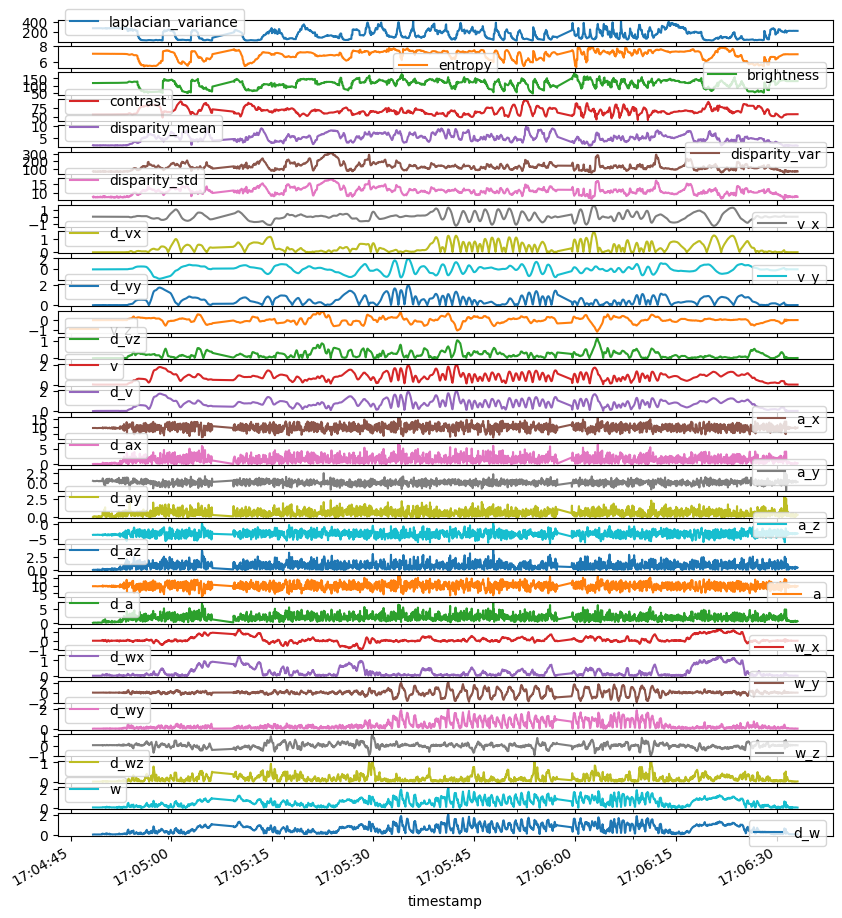

feature   laplacian_variance
======== stationary =======
feature   entropy
======== stationary =======
feature   brightness
======== stationary =======
feature   contrast
======== stationary =======
feature   disparity_mean
======== stationary =======
feature   disparity_var
======== stationary =======
feature   disparity_std
======== stationary =======
feature   v_x
======== stationary =======
feature   d_vx
======== stationary =======
feature   v_y
======== stationary =======
feature   d_vy
======== stationary =======
feature   v_z
======== stationary =======
feature   d_vz
======== stationary =======
feature   v
======== stationary =======
feature   d_v
======== stationary =======
feature   a_x
======== stationary =======
feature   d_ax
======== stationary =======
feature   a_y
======== stationary =======
feature   d_ay
======== stationary =======
feature   a_z
======== stationary =======
feature   d_az
======== stationary =======
feature   a
======== stationary =======
feature   d_

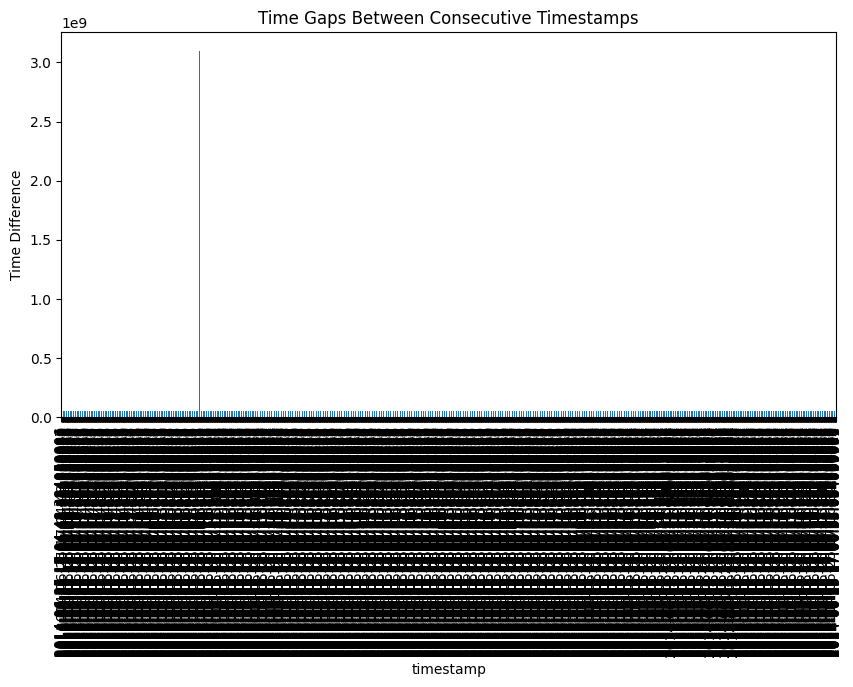

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\448185031.py:3: FutureWarning: 'L' is deprecated and will be removed in a future version, please use 'ms' instead.
  df_resampled = df_input.resample('30L').mean()  # 'S' stands for second intervals


timestamp
2014-06-25 17:04:48.330                      NaT
2014-06-25 17:04:48.360   0 days 00:00:00.030000
2014-06-25 17:04:48.390   0 days 00:00:00.030000
2014-06-25 17:04:48.420   0 days 00:00:00.030000
2014-06-25 17:04:48.450   0 days 00:00:00.030000
                                   ...          
2014-06-25 17:06:32.940   0 days 00:00:00.030000
2014-06-25 17:06:32.970   0 days 00:00:00.030000
2014-06-25 17:06:33.000   0 days 00:00:00.030000
2014-06-25 17:06:33.030   0 days 00:00:00.030000
2014-06-25 17:06:33.060   0 days 00:00:00.030000
Freq: 30ms, Name: timestamp, Length: 3492, dtype: timedelta64[ns]
Max difference: 0 days 00:00:00.030000
Min difference: 0 days 00:00:00.030000
Mean difference: 0 days 00:00:00.030000
Median difference: 0 days 00:00:00.030000


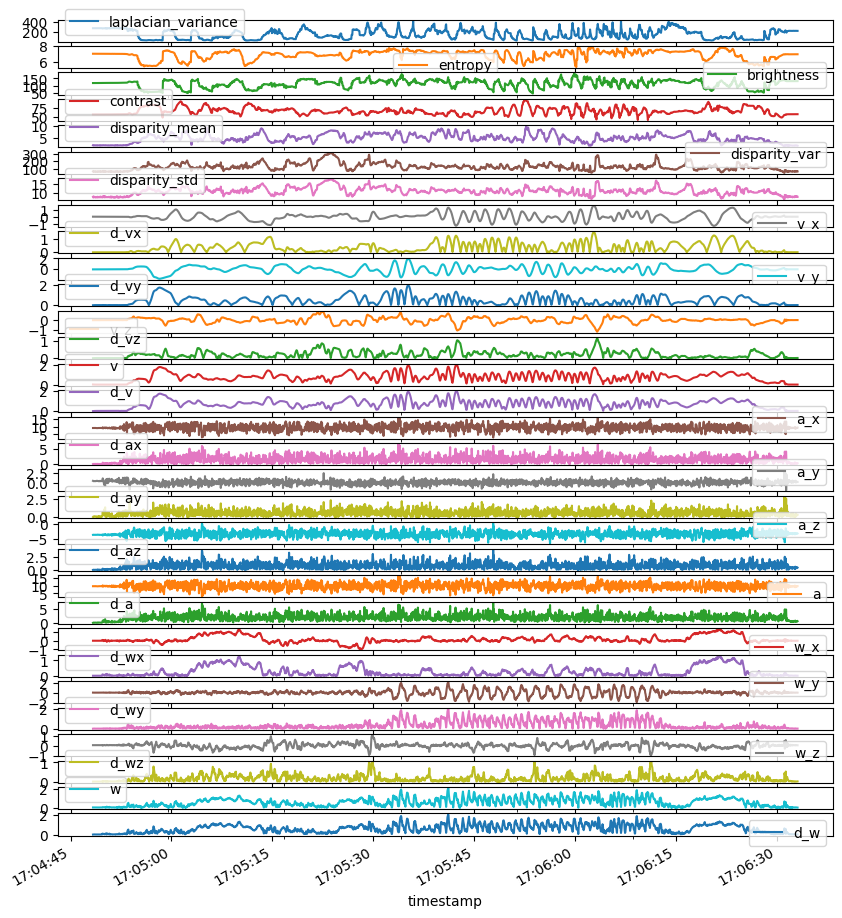

feature   laplacian_variance
======== stationary =======
feature   entropy
======== stationary =======
feature   brightness
======== stationary =======
feature   contrast
======== stationary =======
feature   disparity_mean
======== stationary =======
feature   disparity_var
======== stationary =======
feature   disparity_std
======== stationary =======
feature   v_x
======== stationary =======
feature   d_vx
======== stationary =======
feature   v_y
======== stationary =======
feature   d_vy
======== stationary =======
feature   v_z
======== stationary =======
feature   d_vz
======== stationary =======
feature   v
======== stationary =======
feature   d_v
======== stationary =======
feature   a_x
======== stationary =======
feature   d_ax
======== stationary =======
feature   a_y
======== stationary =======
feature   d_ay
======== stationary =======
feature   a_z
======== stationary =======
feature   d_az
======== stationary =======
feature   a
======== stationary =======
feature   d_

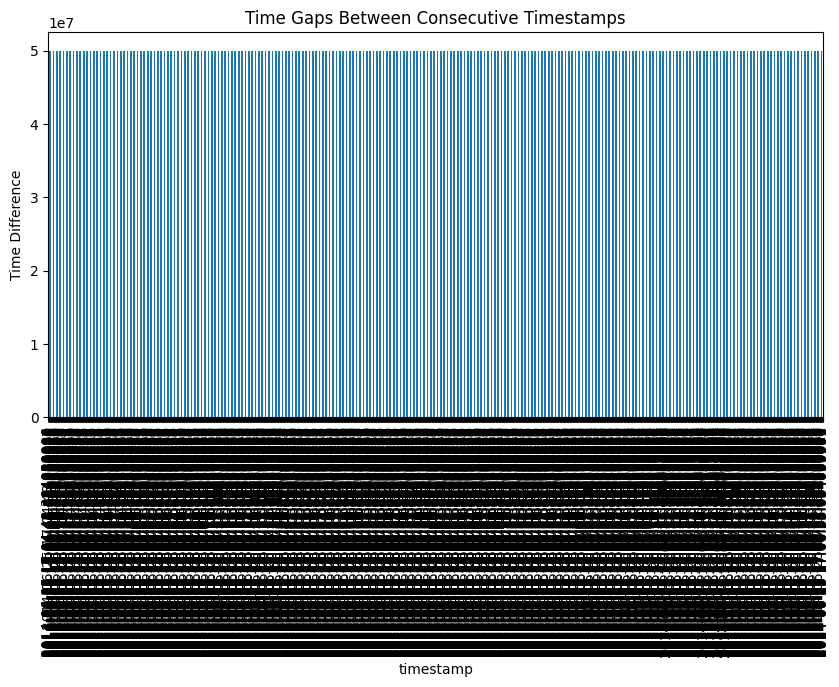

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\448185031.py:3: FutureWarning: 'L' is deprecated and will be removed in a future version, please use 'ms' instead.
  df_resampled = df_input.resample('30L').mean()  # 'S' stands for second intervals


timestamp
2014-06-25 17:04:48.330                      NaT
2014-06-25 17:04:48.360   0 days 00:00:00.030000
2014-06-25 17:04:48.390   0 days 00:00:00.030000
2014-06-25 17:04:48.420   0 days 00:00:00.030000
2014-06-25 17:04:48.450   0 days 00:00:00.030000
                                   ...          
2014-06-25 17:06:32.940   0 days 00:00:00.030000
2014-06-25 17:06:32.970   0 days 00:00:00.030000
2014-06-25 17:06:33.000   0 days 00:00:00.030000
2014-06-25 17:06:33.030   0 days 00:00:00.030000
2014-06-25 17:06:33.060   0 days 00:00:00.030000
Freq: 30ms, Name: timestamp, Length: 3492, dtype: timedelta64[ns]
Max difference: 0 days 00:00:00.030000
Min difference: 0 days 00:00:00.030000
Mean difference: 0 days 00:00:00.030000
Median difference: 0 days 00:00:00.030000


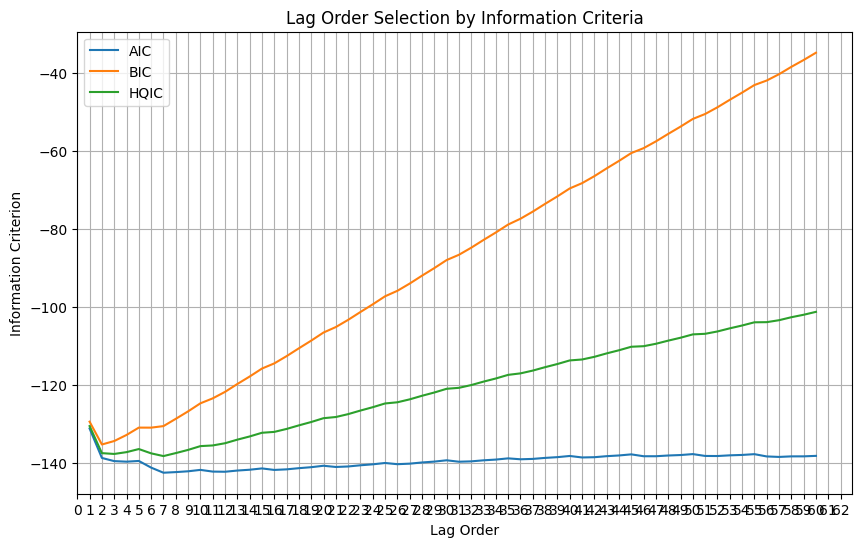

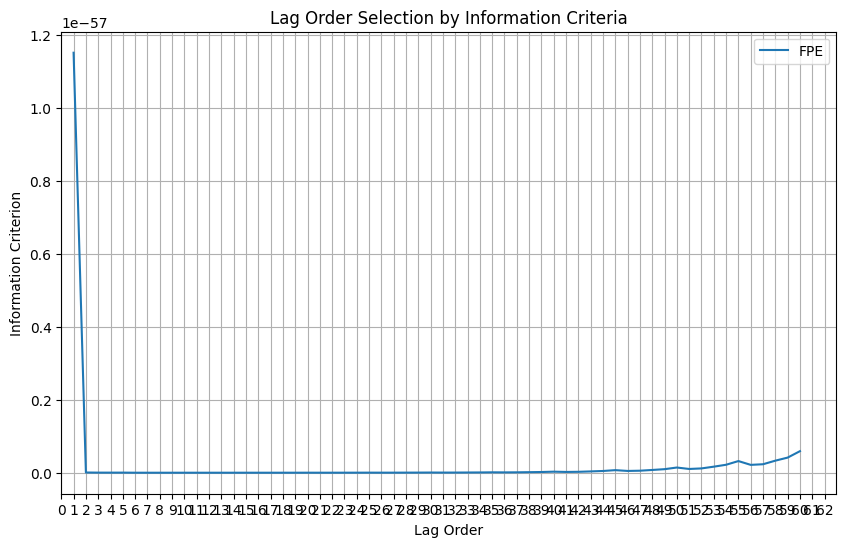

In [19]:
selected_features_1=['laplacian_variance', 'entropy', 'brightness', 'contrast','disparity_mean','disparity_var','disparity_std','v_x','d_vx','v_y','d_vy','v_z','d_vz','v','d_v','a_x','d_ax','a_y','d_ay','a_z','d_az','a','d_a','w_x','d_wx','w_y','d_wy','w_z','d_wz','w','d_w']
df_train_1,df_test_1,df_test_res_1=main_calculation(selected_features_1,True,'features_v103_1.csv','features_v103_2.csv')

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2714797141.py:10: FutureWarning: 'L' is deprecated and will be removed in a future version. Please use 'ms' instead of 'L'.
  axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)


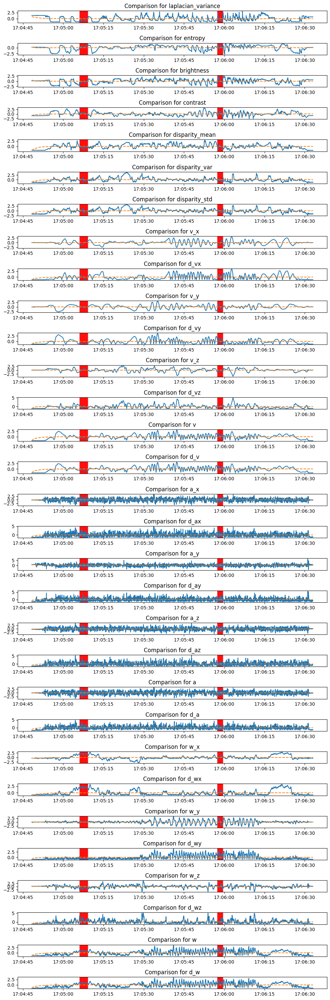

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2714797141.py:24: FutureWarning: 'L' is deprecated and will be removed in a future version. Please use 'ms' instead of 'L'.
  axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)


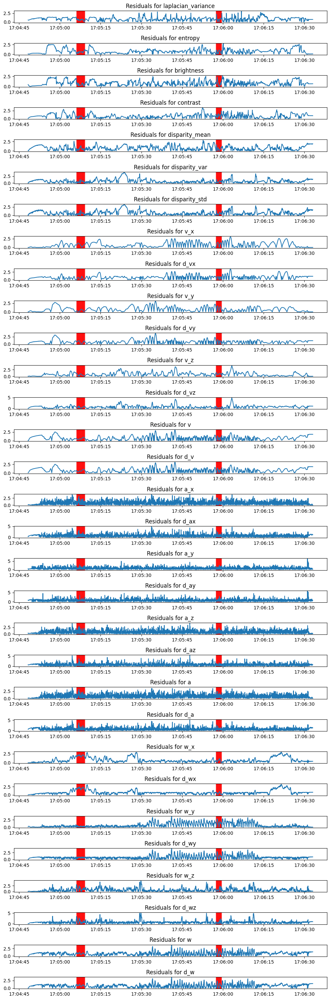

In [20]:
abs_residual_1,var_model_success_1=calculate_residual(selected_features_1,df_train_1,df_test_1,df_test_res_1,7)

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2904197249.py:10: FutureWarning: 'L' is deprecated and will be removed in a future version. Please use 'ms' instead of 'L'.
  axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)


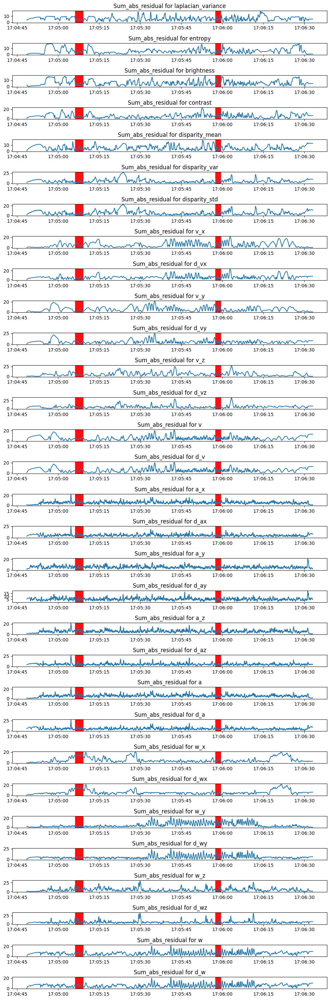

In [21]:
sum_abs_residuals_1=sum_abs_residual(selected_features_1,df_test_res_1,abs_residual_1,7) 

# Analysis: Selected Feature 2

test                   timestamp  laplacian_variance  blur_bool   entropy  \
0     1413394882705760000          278.679521      False  7.306545   
1     1413394882755760000          277.734216      False  7.310415   
2     1413394882805760000          277.213306      False  7.309099   
3     1413394882855760000          276.337646      False  7.307611   
4     1413394882905760000          276.461357      False  7.311522   
...                   ...                 ...        ...       ...   
1867  1413394995205760000          141.985287      False  7.454328   
1868  1413394995305760000          165.079145      False  7.527626   
1869  1413394995405760000          202.417704      False  7.486624   
1870  1413394995505760000          225.399601      False  7.449396   
1871  1413394995605760000          274.195997      False  7.410397   

      brightness   contrast  brightness_contrast_ratio  disparity_mean  \
0     101.761672  85.364682                   1.192082        4.382282   
1   

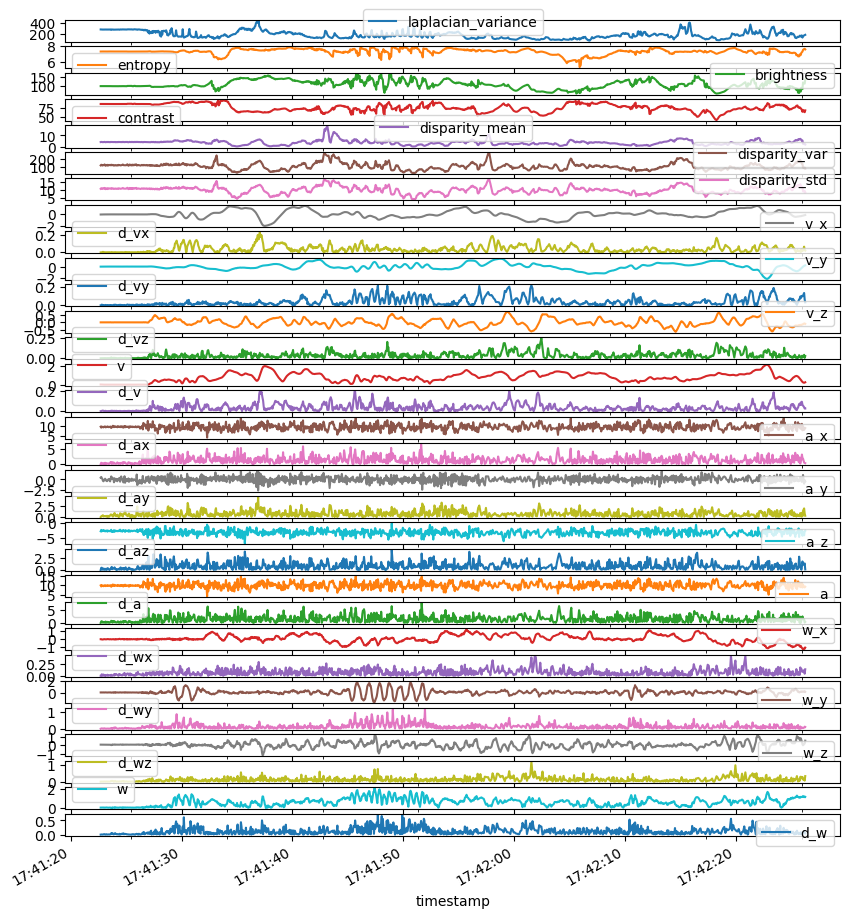

feature   laplacian_variance
======== stationary =======
feature   entropy
======== stationary =======
feature   brightness
======== stationary =======
feature   contrast
======== stationary =======
feature   disparity_mean
======== stationary =======
feature   disparity_var
======== stationary =======
feature   disparity_std
======== stationary =======
feature   v_x
======== stationary =======
feature   d_vx
======== stationary =======
feature   v_y
======== stationary =======
feature   d_vy
======== stationary =======
feature   v_z
======== stationary =======
feature   d_vz
======== stationary =======
feature   v
======== stationary =======
feature   d_v
======== stationary =======
feature   a_x
======== stationary =======
feature   d_ax
======== stationary =======
feature   a_y
======== stationary =======
feature   d_ay
======== stationary =======
feature   a_z
======== stationary =======
feature   d_az
======== stationary =======
feature   a
======== stationary =======
feature   d_

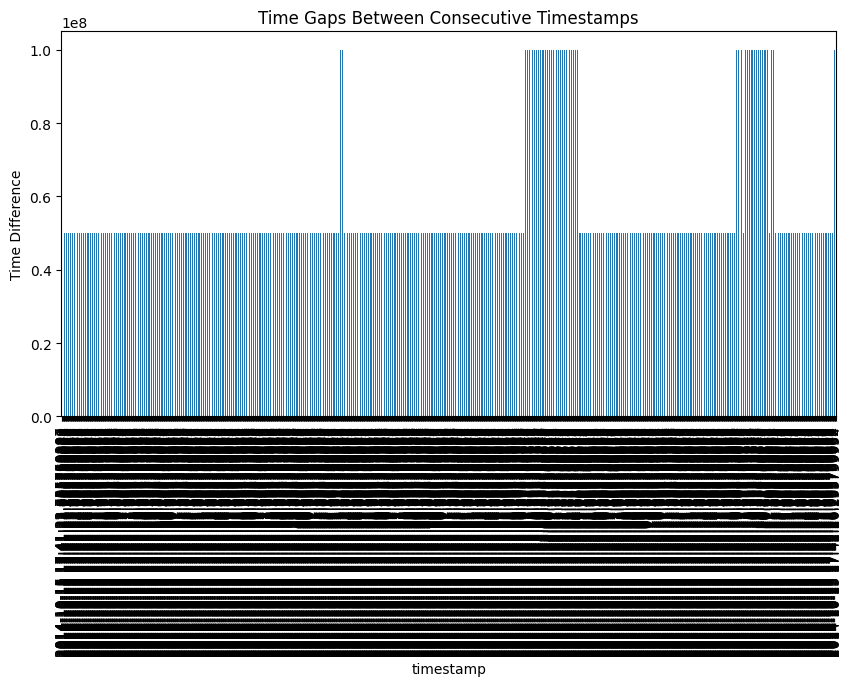

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\448185031.py:3: FutureWarning: 'L' is deprecated and will be removed in a future version, please use 'ms' instead.
  df_resampled = df_input.resample('30L').mean()  # 'S' stands for second intervals


timestamp
2014-10-15 17:41:22.680                      NaT
2014-10-15 17:41:22.710   0 days 00:00:00.030000
2014-10-15 17:41:22.740   0 days 00:00:00.030000
2014-10-15 17:41:22.770   0 days 00:00:00.030000
2014-10-15 17:41:22.800   0 days 00:00:00.030000
                                   ...          
2014-10-15 17:42:26.130   0 days 00:00:00.030000
2014-10-15 17:42:26.160   0 days 00:00:00.030000
2014-10-15 17:42:26.190   0 days 00:00:00.030000
2014-10-15 17:42:26.220   0 days 00:00:00.030000
2014-10-15 17:42:26.250   0 days 00:00:00.030000
Freq: 30ms, Name: timestamp, Length: 2120, dtype: timedelta64[ns]
Max difference: 0 days 00:00:00.030000
Min difference: 0 days 00:00:00.030000
Mean difference: 0 days 00:00:00.030000
Median difference: 0 days 00:00:00.030000


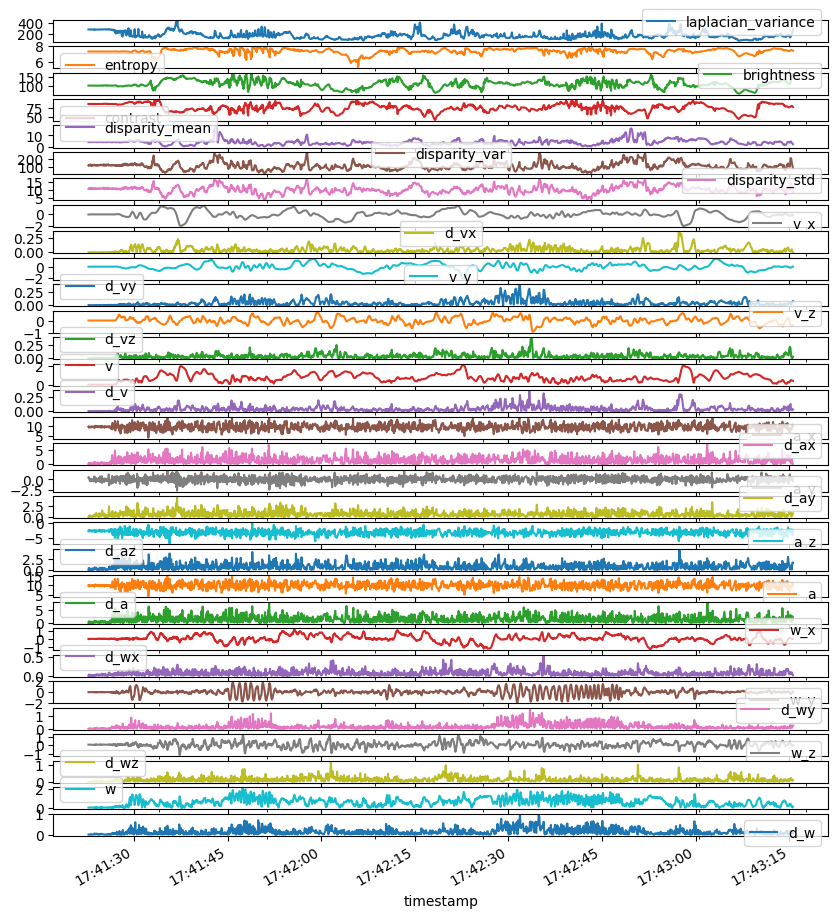

feature   laplacian_variance
======== stationary =======
feature   entropy
======== stationary =======
feature   brightness
======== stationary =======
feature   contrast
======== stationary =======
feature   disparity_mean
======== stationary =======
feature   disparity_var
======== stationary =======
feature   disparity_std
======== stationary =======
feature   v_x
======== stationary =======
feature   d_vx
======== stationary =======
feature   v_y
======== stationary =======
feature   d_vy
======== stationary =======
feature   v_z
======== stationary =======
feature   d_vz
======== stationary =======
feature   v
======== stationary =======
feature   d_v
======== stationary =======
feature   a_x
======== stationary =======
feature   d_ax
======== stationary =======
feature   a_y
======== stationary =======
feature   d_ay
======== stationary =======
feature   a_z
======== stationary =======
feature   d_az
======== stationary =======
feature   a
======== stationary =======
feature   d_

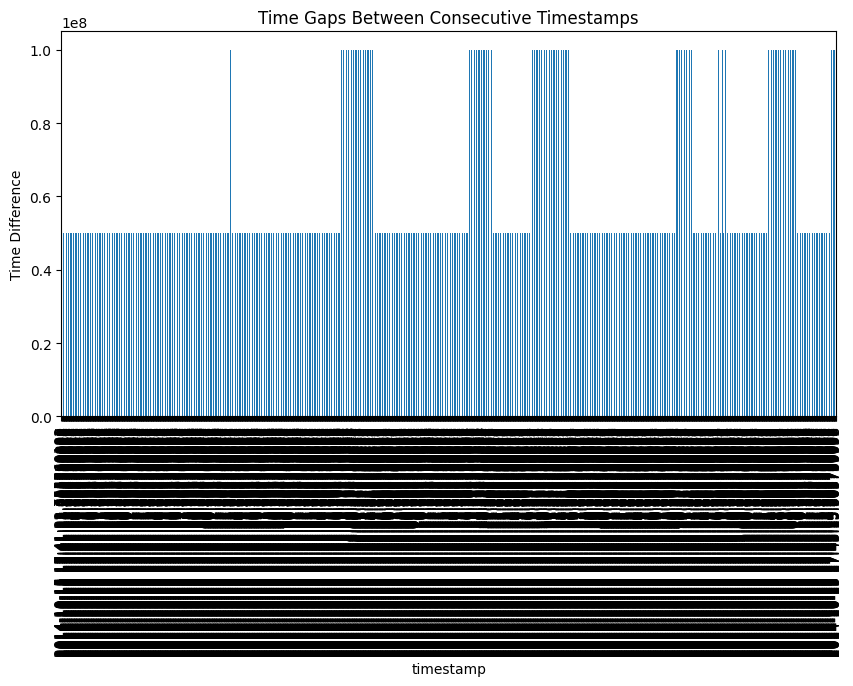

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\448185031.py:3: FutureWarning: 'L' is deprecated and will be removed in a future version, please use 'ms' instead.
  df_resampled = df_input.resample('30L').mean()  # 'S' stands for second intervals


timestamp
2014-10-15 17:41:22.680                      NaT
2014-10-15 17:41:22.710   0 days 00:00:00.030000
2014-10-15 17:41:22.740   0 days 00:00:00.030000
2014-10-15 17:41:22.770   0 days 00:00:00.030000
2014-10-15 17:41:22.800   0 days 00:00:00.030000
                                   ...          
2014-10-15 17:43:15.480   0 days 00:00:00.030000
2014-10-15 17:43:15.510   0 days 00:00:00.030000
2014-10-15 17:43:15.540   0 days 00:00:00.030000
2014-10-15 17:43:15.570   0 days 00:00:00.030000
2014-10-15 17:43:15.600   0 days 00:00:00.030000
Freq: 30ms, Name: timestamp, Length: 3765, dtype: timedelta64[ns]
Max difference: 0 days 00:00:00.030000
Min difference: 0 days 00:00:00.030000
Mean difference: 0 days 00:00:00.030000
Median difference: 0 days 00:00:00.030000


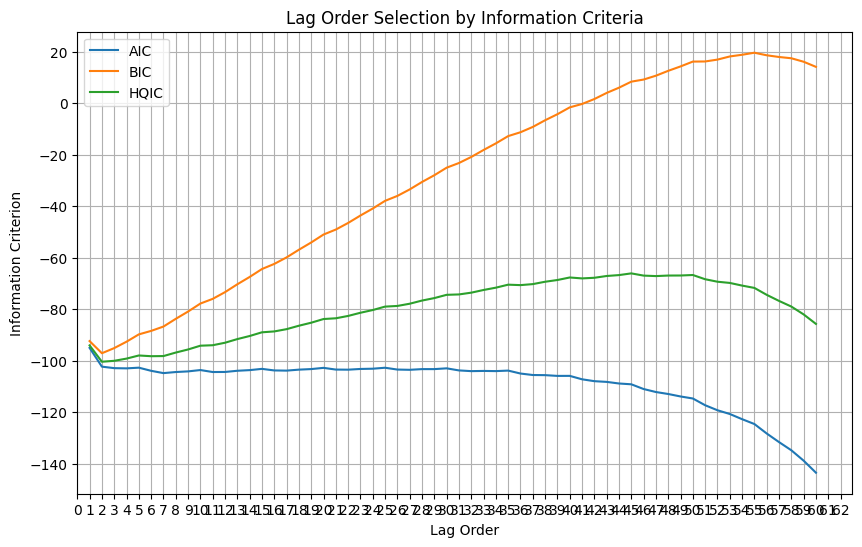

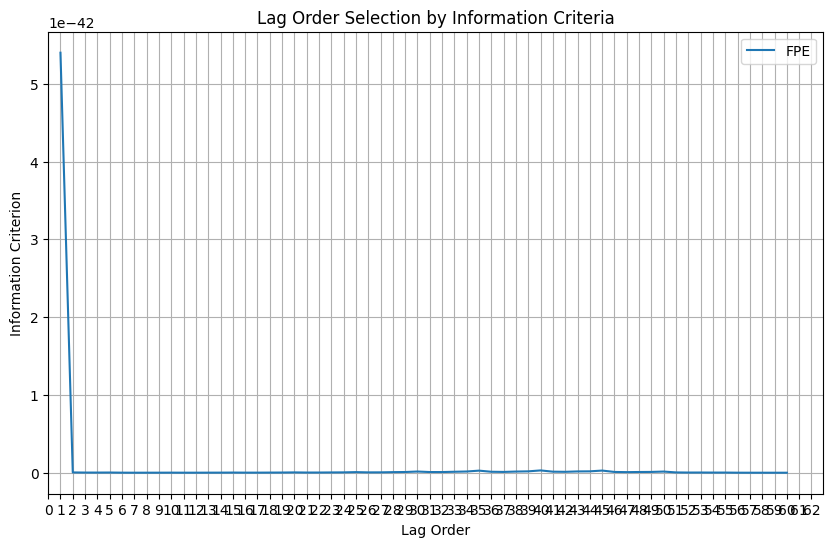

In [22]:
selected_features_2=['laplacian_variance', 'entropy', 'brightness', 'contrast','d_v','d_a','d_w']
df_train_2,df_test_2,df_test_res_2=main_calculation(selected_features_1,True,'features_v203_1.csv','features_v203_2.csv')

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2714797141.py:10: FutureWarning: 'L' is deprecated and will be removed in a future version. Please use 'ms' instead of 'L'.
  axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)


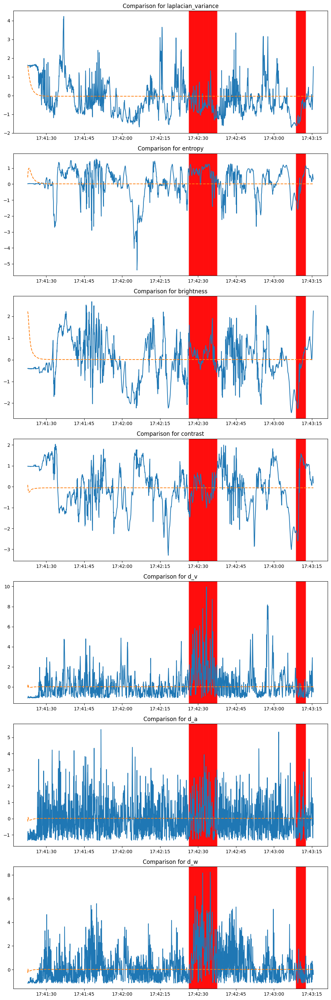

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2714797141.py:24: FutureWarning: 'L' is deprecated and will be removed in a future version. Please use 'ms' instead of 'L'.
  axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)


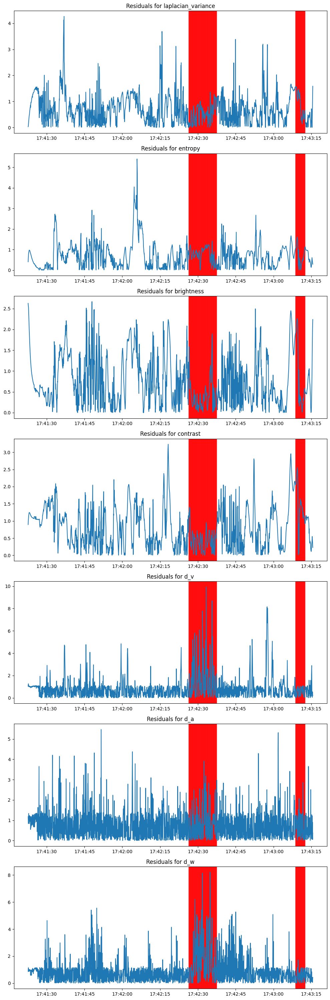

In [23]:
abs_residual_2,var_model_success_2=calculate_residual(selected_features_2,df_train_2,df_test_2,df_test_res_2,7)

C:\Users\nrodw\AppData\Local\Temp\ipykernel_13804\2904197249.py:10: FutureWarning: 'L' is deprecated and will be removed in a future version. Please use 'ms' instead of 'L'.
  axes[i].axvspan(j, j + pd.Timedelta(30, unit='L'), color='red', alpha=0.3)


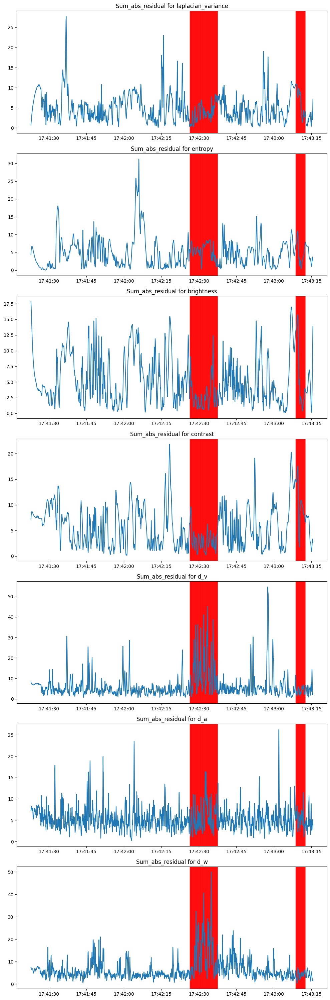

In [24]:
sum_abs_residuals_2=sum_abs_residual(selected_features_2,df_test_res_2,abs_residual_2,7)

# Analysis: Selected Feature 3

      timestamp  laplacian_variance  blur_bool  entropy  brightness  contrast  \
0  1.283234e+18             4738.87      False     7.46     145.914     49.18   
1  1.283234e+18             5114.09      False     7.45     147.896     49.68   
2  1.283234e+18             4895.44      False     7.45     146.946     49.15   
3  1.283234e+18             5149.13      False     7.45     148.042     49.42   
4  1.283234e+18             4673.23      False     7.45     147.184     48.75   

   b_c_ratio  accel_x  accel_y  accel_z  angular_v_x  angular_v_y  \
0      2.967    -4.68    -2.96   -11.82       0.0500       0.0476   
1      2.977    -1.55     1.06    -5.73       0.0218       0.0880   
2      2.990    -4.25    -2.55    -9.72       0.0211      -0.0517   
3      2.996     3.71    -1.63   -11.16       0.0960      -0.3591   
4      3.019     4.88    -4.15   -17.34       0.0772      -0.3369   

   angular_v_z     v_x      v_y     v_z    roll   pitch     yaw  success  
0      -0.1478 -5.5852 

/tmp/ipykernel_18459/427674557.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = df['timestamp'] / 1e9  # Convert from nanoseconds to seconds
/tmp/ipykernel_18459/427674557.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')


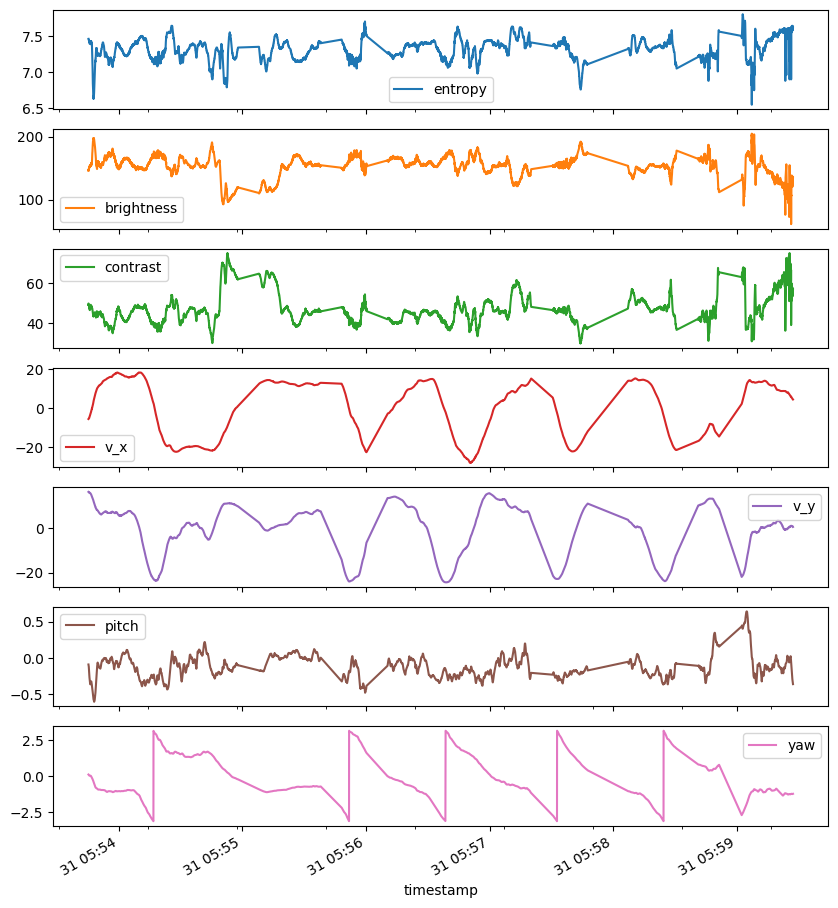

feature   entropy
======== stationary =======
feature   brightness
======== stationary =======
feature   contrast
======== stationary =======
feature   v_x
v_x is not stationary, differencing...
feature   v_y
v_y is not stationary, differencing...
feature   pitch
======== stationary =======
feature   yaw
======== stationary =======
timestamp
2010-08-31 05:53:45.302220032                         NaT
2010-08-31 05:53:45.335620096   0 days 00:00:00.033400064
2010-08-31 05:53:45.368960000   0 days 00:00:00.033339904
2010-08-31 05:53:45.402220032   0 days 00:00:00.033260032
2010-08-31 05:53:45.435589888   0 days 00:00:00.033369856
                                           ...           
2010-08-31 05:59:27.124669952   0 days 00:00:00.033260032
2010-08-31 05:59:27.158040064   0 days 00:00:00.033370112
2010-08-31 05:59:27.191409920   0 days 00:00:00.033369856
2010-08-31 05:59:27.224689920      0 days 00:00:00.033280
2010-08-31 05:59:27.258050048   0 days 00:00:00.033360128
Name: timestamp, L

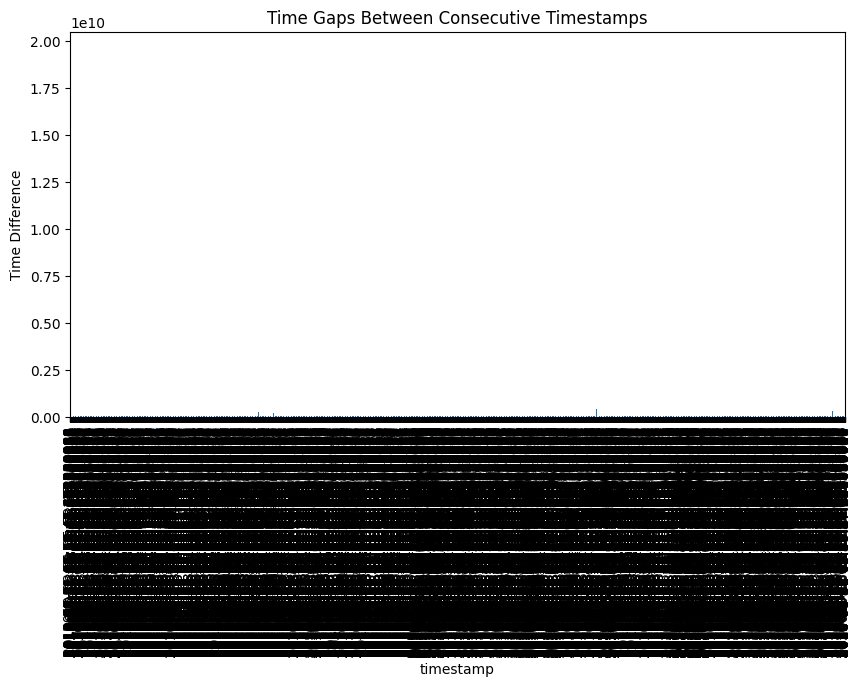

timestamp
2010-08-31 05:53:45.300                      NaT
2010-08-31 05:53:45.330   0 days 00:00:00.030000
2010-08-31 05:53:45.360   0 days 00:00:00.030000
2010-08-31 05:53:45.390   0 days 00:00:00.030000
2010-08-31 05:53:45.420   0 days 00:00:00.030000
                                   ...          
2010-08-31 05:59:27.120   0 days 00:00:00.030000
2010-08-31 05:59:27.150   0 days 00:00:00.030000
2010-08-31 05:59:27.180   0 days 00:00:00.030000
2010-08-31 05:59:27.210   0 days 00:00:00.030000
2010-08-31 05:59:27.240   0 days 00:00:00.030000
Freq: 30L, Name: timestamp, Length: 11399, dtype: timedelta64[ns]
Max difference: 0 days 00:00:00.030000
Min difference: 0 days 00:00:00.030000
Mean difference: 0 days 00:00:00.030000
Median difference: 0 days 00:00:00.030000
      timestamp  laplacian_variance  blur_bool  entropy  brightness  contrast  \
0  1.283234e+18             4738.87      False     7.46     145.914     49.18   
1  1.283234e+18             5114.09      False     7.45     147

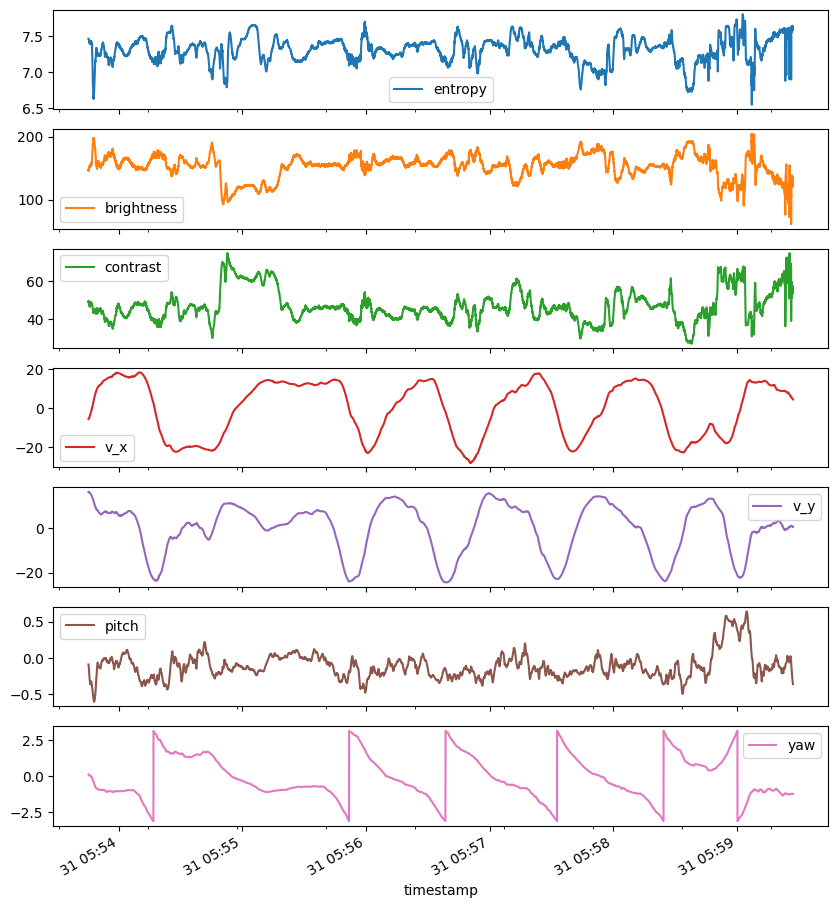

feature   entropy
======== stationary =======
feature   brightness
======== stationary =======
feature   contrast
======== stationary =======
feature   v_x
======== stationary =======
feature   v_y
======== stationary =======
feature   pitch
======== stationary =======
feature   yaw
======== stationary =======
timestamp
2010-08-31 05:53:45.302220032                         NaT
2010-08-31 05:53:45.335620096   0 days 00:00:00.033400064
2010-08-31 05:53:45.368960000   0 days 00:00:00.033339904
2010-08-31 05:53:45.402220032   0 days 00:00:00.033260032
2010-08-31 05:53:45.435589888   0 days 00:00:00.033369856
                                           ...           
2010-08-31 05:59:27.124669952   0 days 00:00:00.033260032
2010-08-31 05:59:27.158040064   0 days 00:00:00.033370112
2010-08-31 05:59:27.191409920   0 days 00:00:00.033369856
2010-08-31 05:59:27.224689920      0 days 00:00:00.033280
2010-08-31 05:59:27.258050048   0 days 00:00:00.033360128
Name: timestamp, Length: 9797, dtype: ti

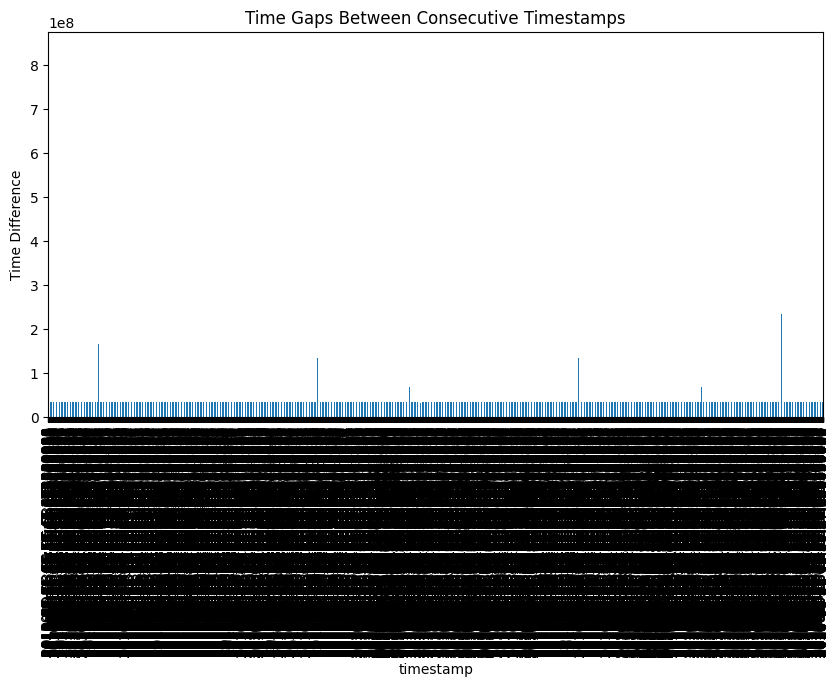

timestamp
2010-08-31 05:53:45.300                      NaT
2010-08-31 05:53:45.330   0 days 00:00:00.030000
2010-08-31 05:53:45.360   0 days 00:00:00.030000
2010-08-31 05:53:45.390   0 days 00:00:00.030000
2010-08-31 05:53:45.420   0 days 00:00:00.030000
                                   ...          
2010-08-31 05:59:27.120   0 days 00:00:00.030000
2010-08-31 05:59:27.150   0 days 00:00:00.030000
2010-08-31 05:59:27.180   0 days 00:00:00.030000
2010-08-31 05:59:27.210   0 days 00:00:00.030000
2010-08-31 05:59:27.240   0 days 00:00:00.030000
Freq: 30L, Name: timestamp, Length: 11399, dtype: timedelta64[ns]
Max difference: 0 days 00:00:00.030000
Min difference: 0 days 00:00:00.030000
Mean difference: 0 days 00:00:00.030000
Median difference: 0 days 00:00:00.030000


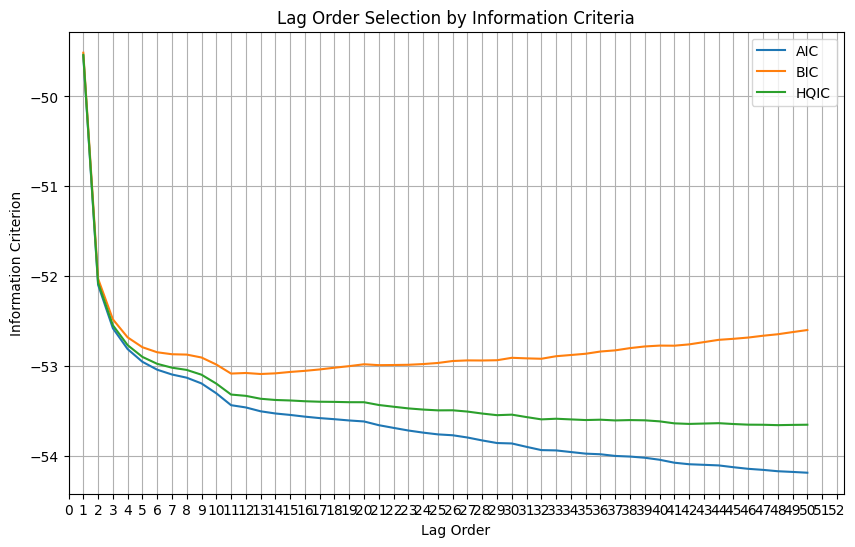

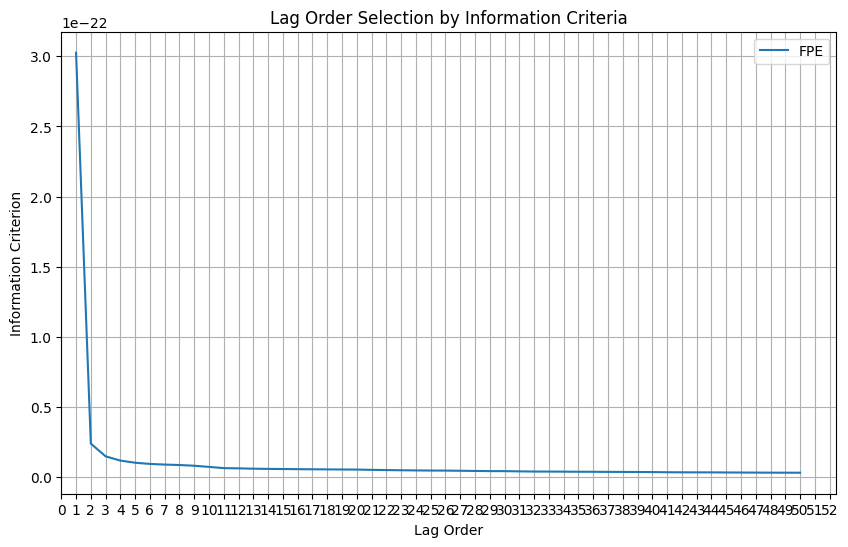

In [70]:
selected_features_3=[ 'entropy', 'brightness', 'contrast','v_x','v_y','pitch','yaw']
df_train_3,df_test_3,df_test_res_3=main_calculation('kagaru_img_imu_ins_trim_begin.csv',selected_features_3)

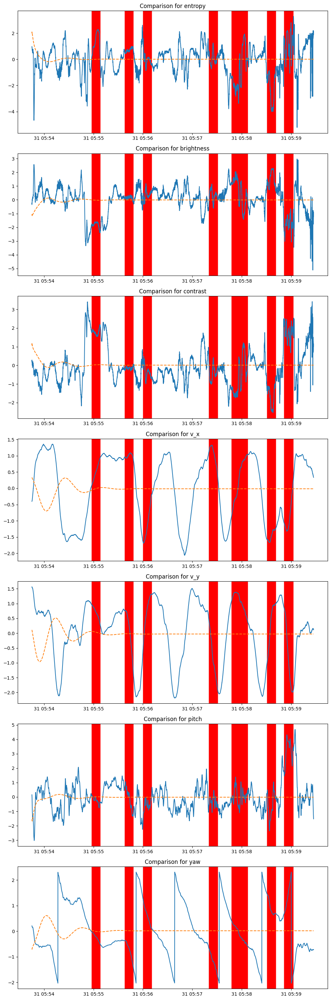

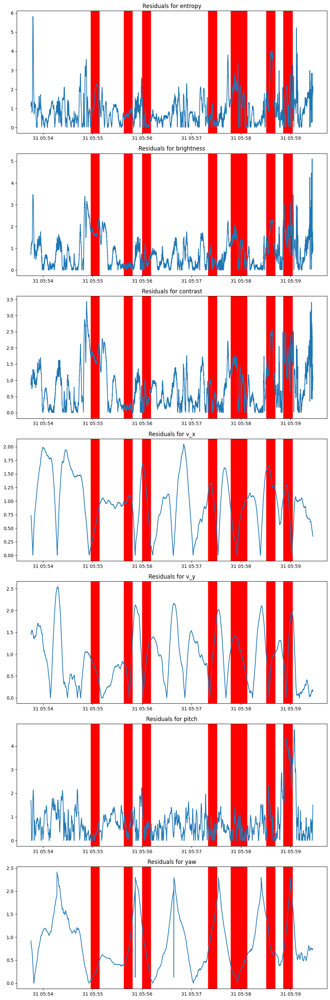

In [71]:
abs_residual_3,var_model_success_3=calculate_residual(selected_features_3,df_train_3,df_test_3,df_test_res_3,11)

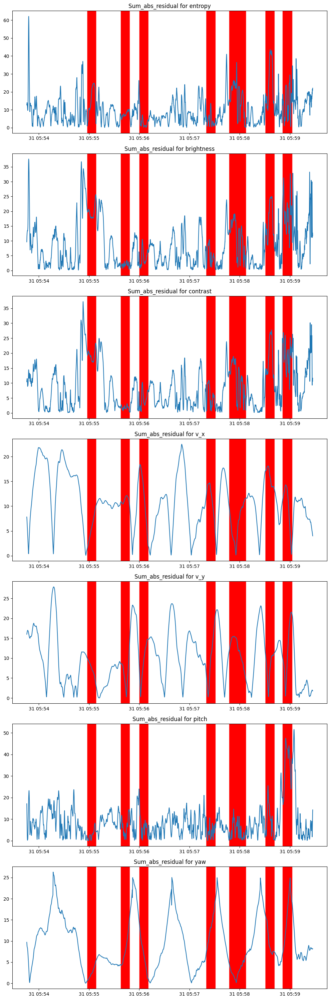

In [73]:
sum_abs_residuals_3=sum_abs_residual(selected_features_3,df_test_res_3,abs_residual_3,11)

In [91]:
sum_abs_residuals_3

,entropy,brightness,contrast,v_x,v_y,pitch,yaw
timestamp,,,,,,,
2010-08-31 05:53:45.600,12.694928,9.653518,10.441046,7.824305,16.018316,17.133157,9.700695
2010-08-31 05:53:45.630,12.852326,9.994183,10.643084,7.771228,16.036114,16.654086,9.616309
2010-08-31 05:53:45.660,12.901037,10.275824,10.722463,7.714221,16.055815,16.042106,9.535878
2010-08-31 05:53:45.690,13.033128,10.529908,10.856090,7.653935,16.085416,15.319176,9.450173
2010-08-31 05:53:45.720,13.171324,10.788308,10.983330,7.586360,16.115675,14.481366,9.362435
...,...,...,...,...,...,...,...
2010-08-31 05:59:27.120,21.125360,11.963740,11.216397,4.153374,1.873911,12.255280,8.172236
2010-08-31 05:59:27.150,21.261384,11.852584,11.323604,4.115454,1.856126,12.818237,8.169678
2010-08-31 05:59:27.180,21.533432,12.284268,11.385934,4.080079,1.840501,13.361354,8.165530


timestamp
2010-08-31 05:53:45.600    0.202364
2010-08-31 05:53:45.630    0.204906
2010-08-31 05:53:45.660    0.205693
2010-08-31 05:53:45.690    0.207826
2010-08-31 05:53:45.720    0.210058
                             ...   
2010-08-31 05:59:27.120    0.310144
2010-08-31 05:59:27.150    0.310047
2010-08-31 05:59:27.180    0.309889
2010-08-31 05:59:27.210    0.309607
2010-08-31 05:59:27.240    0.309233
Name: combined_normalized, Length: 79723, dtype: float64


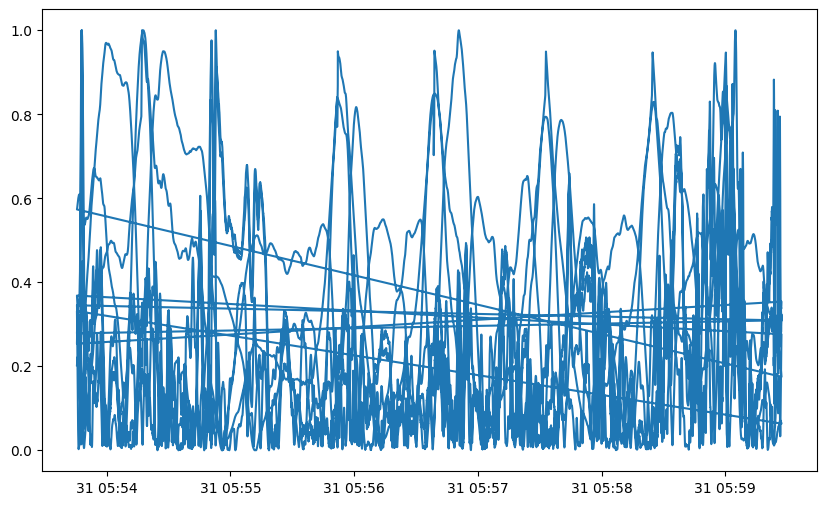

In [90]:
total_residuals_3=normalize_and_combine(selected_features_3,df_test_res_3,sum_abs_residuals_3)

In [76]:
total_residuals_3

,combined_normalized
timestamp,
2010-08-31 05:53:45.600,0.326915
2010-08-31 05:53:45.630,0.346025
2010-08-31 05:53:45.660,0.351939
2010-08-31 05:53:45.690,0.367976
2010-08-31 05:53:45.720,0.384755
...,...
2010-08-31 05:59:27.120,-0.230839
2010-08-31 05:59:27.150,-0.231241
2010-08-31 05:59:27.180,-0.231894
